<a href="https://colab.research.google.com/github/patrick-hanley/thought_experiments/blob/master/_notebooks/2021_02_01_eda.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# "Useful tools for easy explatory data analysis (EDA)"
> "Off the shelf and simple functions for data analysis"


- toc: true
- branch: master
- badges: false
- comments: true
- categories: [data, eda, pandas]
- image: images/spectrogram/Feb-05-2021_12-10-51_sample_audio.gif
- hide: false
- search_exclude: true
- metadata_key1: metadata_value1
- metadata_key2: metadata_value2

#A currated list of useful tools for data analysis.



*   pyviz
*   List item



In [4]:
# I came across this funtion on Kaggle(I think), but I cannot find who to attribute it to
def resumetable(df):
    # Summerizes dataframe, types, count, missing, etc.
    print(f"Dataset Shape: {df.shape}")
    summary = pd.DataFrame(df.dtypes,columns=['dtypes'])
    summary = summary.reset_index()
    summary['Name'] = summary['index']
    summary = summary[['Name','dtypes']]
    summary['Missing'] = df.isnull().sum().values    
    summary['Uniques'] = df.nunique().values
    summary['First Value'] = df.iloc[0].values
    summary['Second Value'] = df.iloc[1].values
    return summary

Lets test it out with some data that came from the Melanoma kaggle contest.
This is metadata associated with the imaages of potential melanoma. 

In [1]:
#import pandas as pd
from google.colab import drive
mnt=drive.mount('/content/gdrive', force_remount=True)
root_dir = "/content/gdrive/My Drive/"

base_dir = root_dir + 'melanoma_328'



Mounted at /content/gdrive


In [2]:
csv_path

NameError: ignored

In [26]:
!pwd

/content


Typically, the first thing to do is examine the first rows of data

In [6]:
df = pd.read_csv(csv_path) # pydicom metadata train baseline
df.head()

,Unnamed: 0,file_name,SOP_Instance_UID,Study_Date,Study_Time,Code_Value,Code_Meaning,Patient's_Sex,Body_Part_Examined,Study_Instance_UID,Series_Instance_UID,Study_ID,Rows,Columns,age,image_name
0,0,ISIC_0015719.dcm,1.3.6.1.4.1.5962.99.1.7166.2915.1589854541695....,20200519,21541,281733008,Skin_of_part_of_upper_limb,F,UPPER_EXTREMITY,1.3.6.1.4.1.5962.99.1.7166.2915.1589854541695....,1.3.6.1.4.1.5962.99.1.7166.2915.1589854541695....,ISIC_0015719,4000,6000,40,ISIC_0015719
1,1,ISIC_0052212.dcm,1.3.6.1.4.1.5962.99.1.7623.4154.1589900259084....,20200519,145738,281739007,Skin_of_part_of_lower_limb,F,LOWER_EXTREMITY,1.3.6.1.4.1.5962.99.1.7623.4154.1589900259084....,1.3.6.1.4.1.5962.99.1.7623.4154.1589900259084....,ISIC_0052212,1053,1872,50,ISIC_0052212
2,2,ISIC_0068279.dcm,1.3.6.1.4.1.5962.99.1.7647.2874.1589902665117....,20200519,153744,70762009,Skin_of_head,F,HEAD/NECK,1.3.6.1.4.1.5962.99.1.7647.2874.1589902665117....,1.3.6.1.4.1.5962.99.1.7647.2874.1589902665117....,ISIC_0068279,1053,1872,45,ISIC_0068279
3,3,ISIC_0074268.dcm,1.3.6.1.4.1.5962.99.1.7217.2349.1589859673142....,20200519,34112,281733008,Skin_of_part_of_upper_limb,F,UPPER_EXTREMITY,1.3.6.1.4.1.5962.99.1.7217.2349.1589859673142....,1.3.6.1.4.1.5962.99.1.7217.2349.1589859673142....,ISIC_0074268,4000,6000,55,ISIC_0074268
4,4,ISIC_0074311.dcm,1.3.6.1.4.1.5962.99.1.7192.6825.1589857177121....,20200519,25936,281739007,Skin_of_part_of_lower_limb,F,LOWER_EXTREMITY,1.3.6.1.4.1.5962.99.1.7192.6825.1589857177121....,1.3.6.1.4.1.5962.99.1.7192.6825.1589857177121....,ISIC_0074311,4000,6000,40,ISIC_0074311


I found resumetable to be very convenient.  We get a sense of cardinaltiy from Uniques and we can easily see where we are missing data.  For example, there are 65 cases of Patient's_Sex that will need to be accounted for.

Looks like there are 33,126 unique images, but only 23,978 unique study times.  Perhaps there are really only 23,978 unique images and the other 9,148 images are odified duplicates. 

In [7]:
resumetable(df)

Dataset Shape: (33126, 16)


,Name,dtypes,Missing,Uniques,First Value,Second Value
0,Unnamed: 0,int64,0,5000,0,1
1,file_name,object,0,33126,ISIC_0015719.dcm,ISIC_0052212.dcm
2,SOP_Instance_UID,object,0,33126,1.3.6.1.4.1.5962.99.1.7166.2915.1589854541695....,1.3.6.1.4.1.5962.99.1.7623.4154.1589900259084....
3,Study_Date,int64,0,4,20200519,20200519
4,Study_Time,int64,0,23978,21541,145738
5,Code_Value,int64,0,5,281733008,281739007
6,Code_Meaning,object,0,5,Skin_of_part_of_upper_limb,Skin_of_part_of_lower_limb
7,Patient's_Sex,object,65,3,F,F
8,Body_Part_Examined,object,0,7,UPPER_EXTREMITY,LOWER_EXTREMITY
9,Study_Instance_UID,object,0,33126,1.3.6.1.4.1.5962.99.1.7166.2915.1589854541695....,1.3.6.1.4.1.5962.99.1.7623.4154.1589900259084....


Another tool I use is [data

In [10]:
import sys

#!"{sys.executable}" -m pip install -U pandas-profiling[notebook]
!jupyter nbextension enable --py widgetsnbextension

Enabling notebook extension jupyter-js-widgets/extension...
      - Validating: OK


In [11]:
# Standard Library Imports
from pathlib import Path

import pandas as pd
from ipywidgets import widgets

# Our package
from pandas_profiling import ProfileReport
from pandas_profiling.utils.cache import cache_file

In [12]:
csv_path = (base_dir+'/combined_meta_df_reduced.csv')
df = pd.read_csv(csv_path)

In [13]:
profile = ProfileReport(df, title="Titanic Dataset", html={"style": {"full_width": True}}, sort="None")


Takes a couple minutes to process and display the results.

You do get some richer analysis like Correlation plots and distributions of the variables.

In [14]:
# The Notebook Widgets Interface
profile.to_widgets()

/usr/local/lib/python3.6/dist-packages/pandas_profiling/profile_report.py:416: UserWarning: Ipywidgets is not yet fully supported on Google Colab (https://github.com/googlecolab/colabtools/issues/60).As an alternative, you can use the HTML report. See the documentation for more information.
  "Ipywidgets is not yet fully supported on Google Colab (https://github.com/googlecolab/colabtools/issues/60)."


Summarize dataset:   0%|          | 0/29 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render widgets:   0%|          | 0/1 [00:00<?, ?it/s]

An alternative is [Sweetviz]()

In [17]:
#hide
!pip install sweetviz

     |████████████████████████████████| 15.1MB 316kB/s 


                                             |          | [  0%]   00:00 -> (? left)


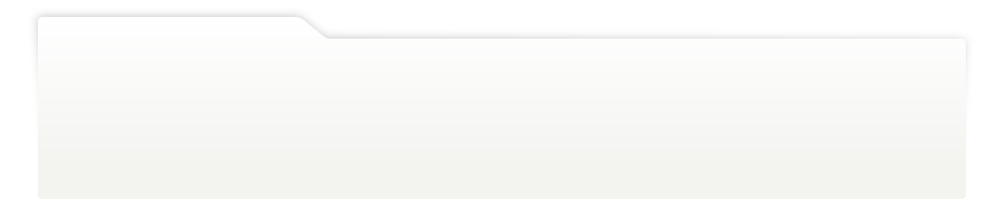
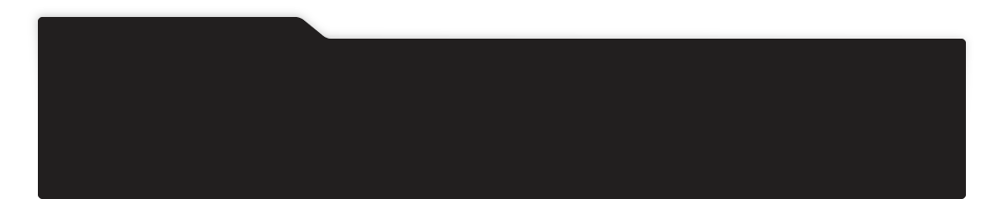
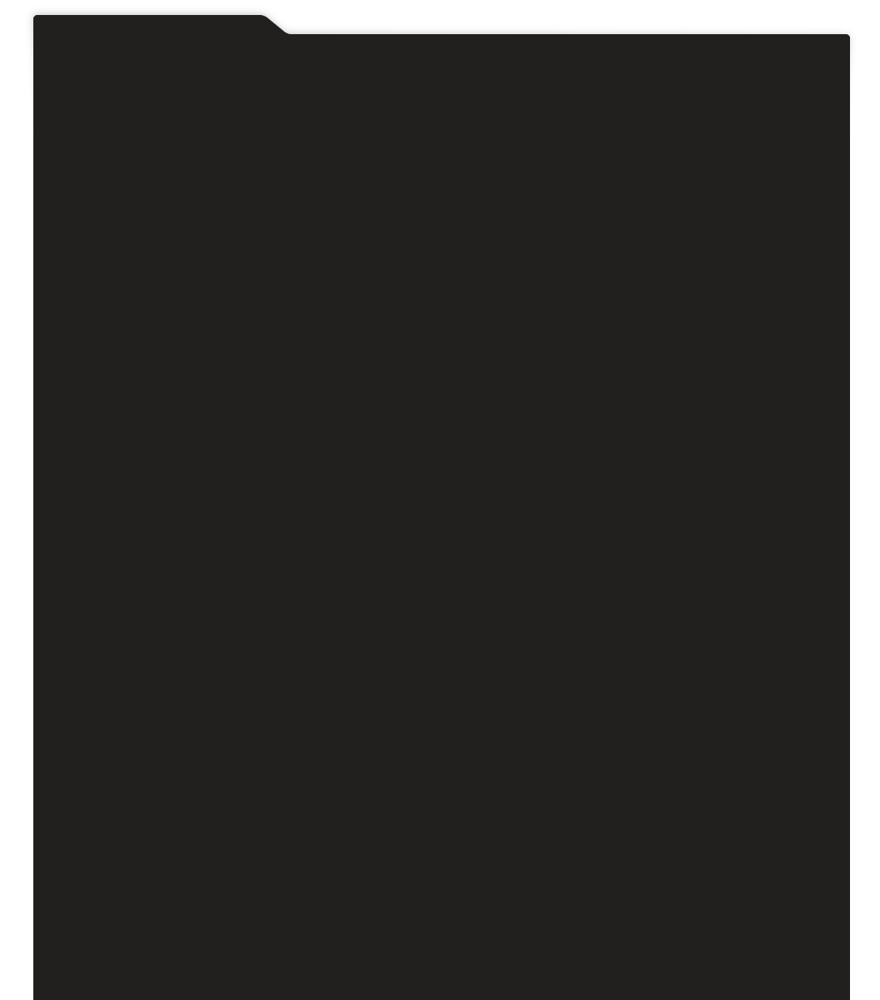
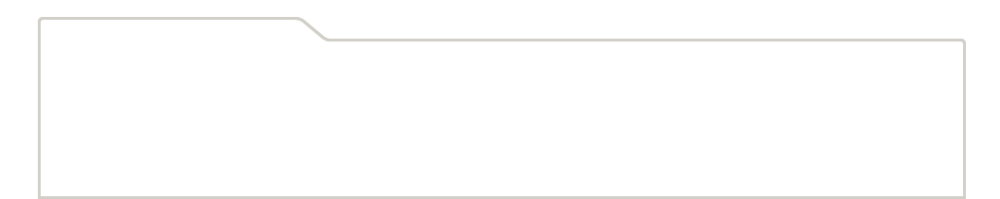
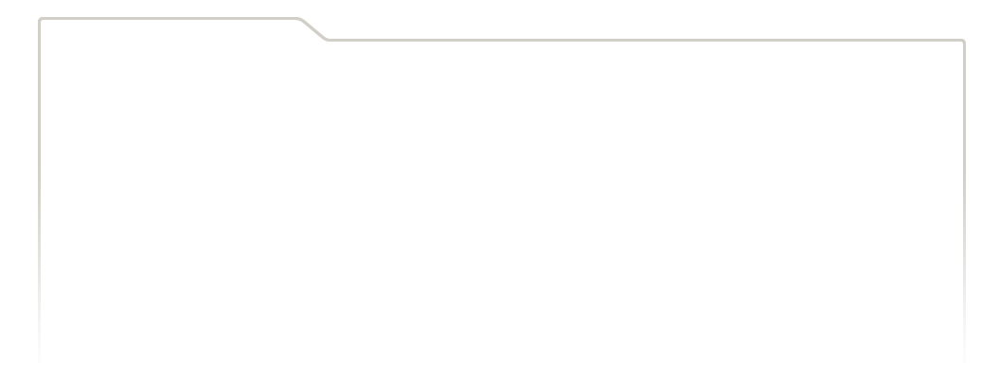
...
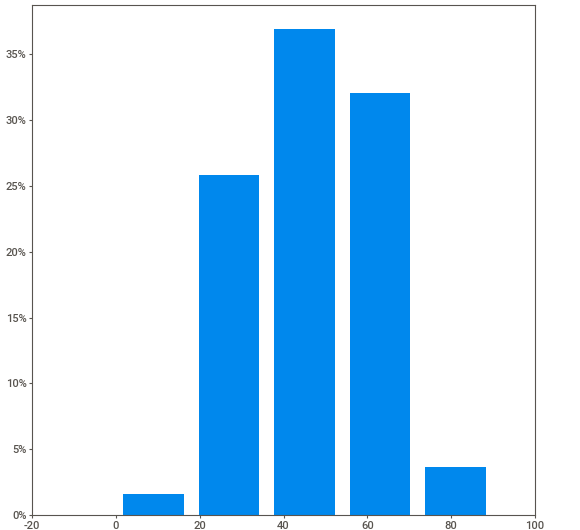
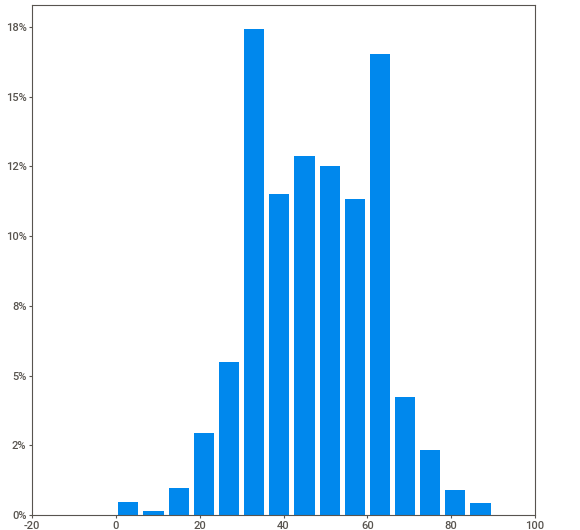
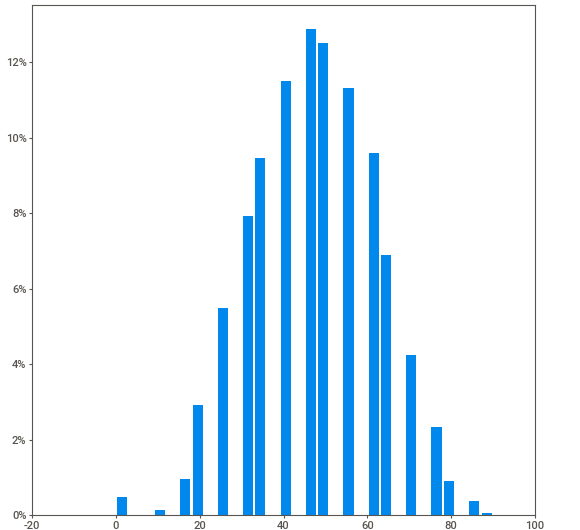
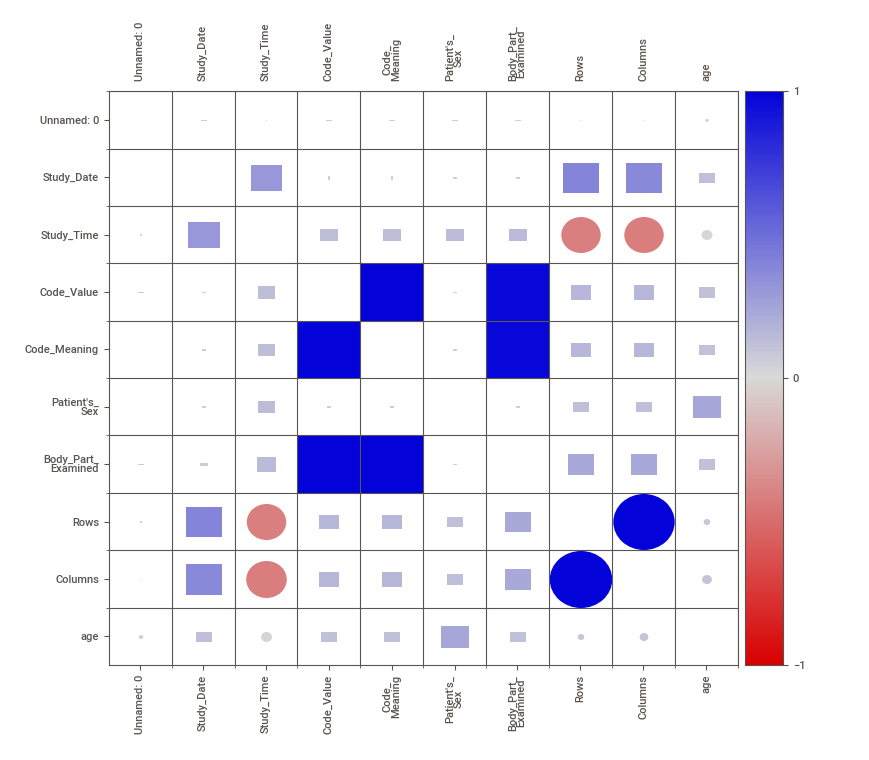
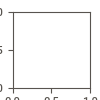

In [47]:
import sweetviz as sv
sweet_report = sv.analyze(df)
sweet_report.show_notebook('sweet_report.html')